In [1]:
import sys
sys.path.insert(0, '..')

In [3]:
from submissions.ab_submission.dataLoaders import imageDataLoader
from submissions.ab_submission.object_detector import ObjectDetector
from submissions.ab_submission import dataset
from submissions.ab_submission import toolbox

import importlib

importlib.reload(dataset)

<module 'submissions.ab_submission.dataset' from 'c:\\Users\\4078182\\Personal\\git\\follicles_detection\\notebooks\\..\\submissions\\ab_submission\\dataset.py'>

In [4]:
import glob
import pandas as pd
from matplotlib import pyplot as plt

In [6]:
train_files = glob.glob("../data/train/*.jpg")
test_files = glob.glob("../data/test/*.jpg")
train_label = pd.read_csv("../data/train/labels.csv")
test_label = pd.read_csv("../data/test/labels.csv")

In [7]:
X_test = test_files
y_test = test_label[["filename","xmin","xmax","ymin","ymax","label"]]

X_train = train_files
y_train = train_label[["filename","xmin","xmax","ymin","ymax","label"]]

In [8]:
test_loader = imageDataLoader(X_test, y_test)
train_loader = imageDataLoader(X_train, y_train)
predict_loader = imageDataLoader(X_test, None)

In [9]:
import cv2
import numpy as np

In [10]:
from PIL import Image
from PIL import ImageDraw
from sklearn.utils import check_array
import cv2

In [593]:
filename=X_train[1]
image = cv2.imread(filename)
image_pow = (image/255.)**3
image_pow = ((image_pow/image_pow.max())*255).astype(np.uint8)

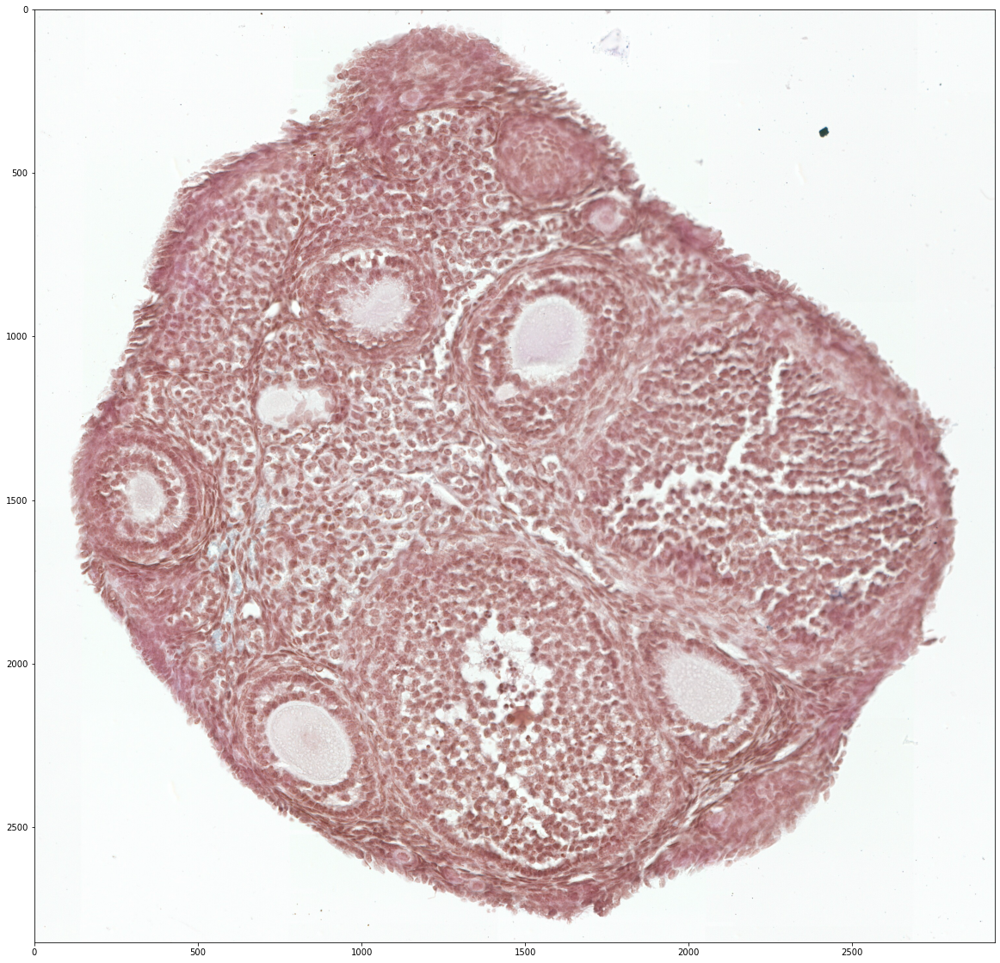

In [594]:
plt.figure(figsize=(20,50))

plt.imshow(image)

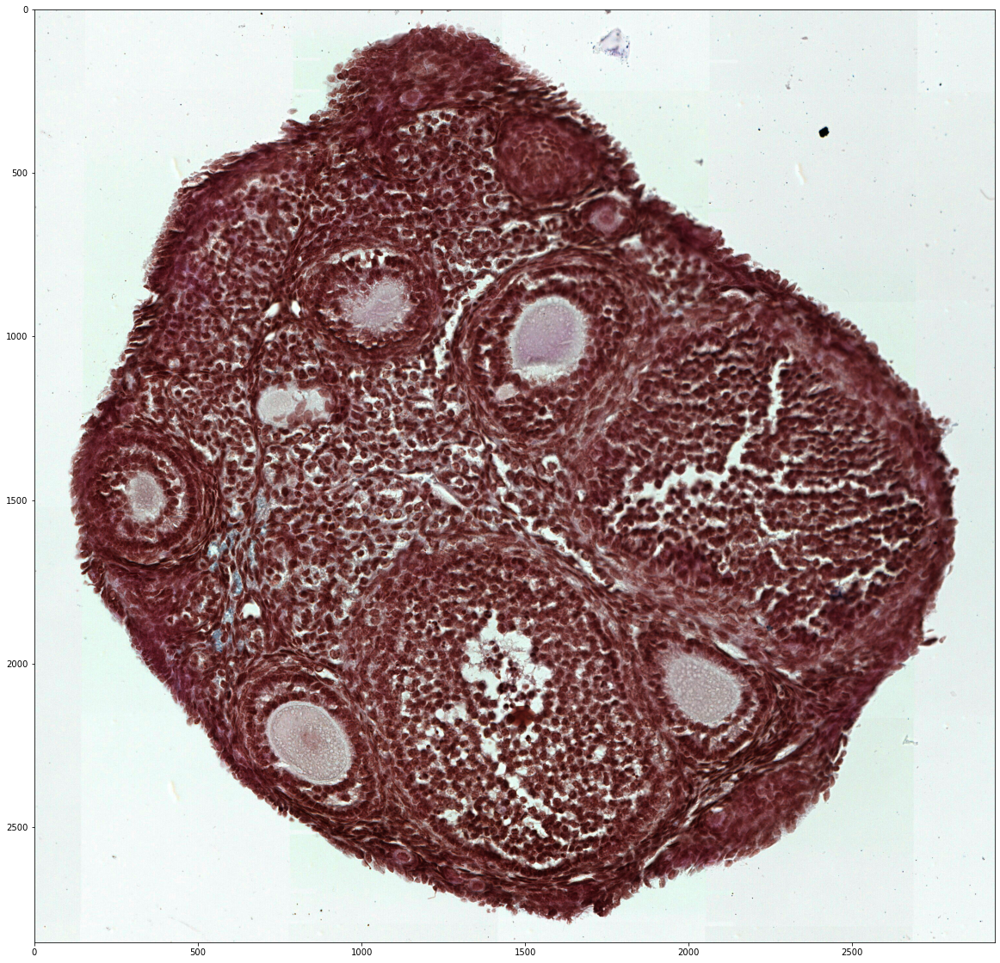

In [595]:
plt.figure(figsize=(20,50))

plt.imshow(image_pow)

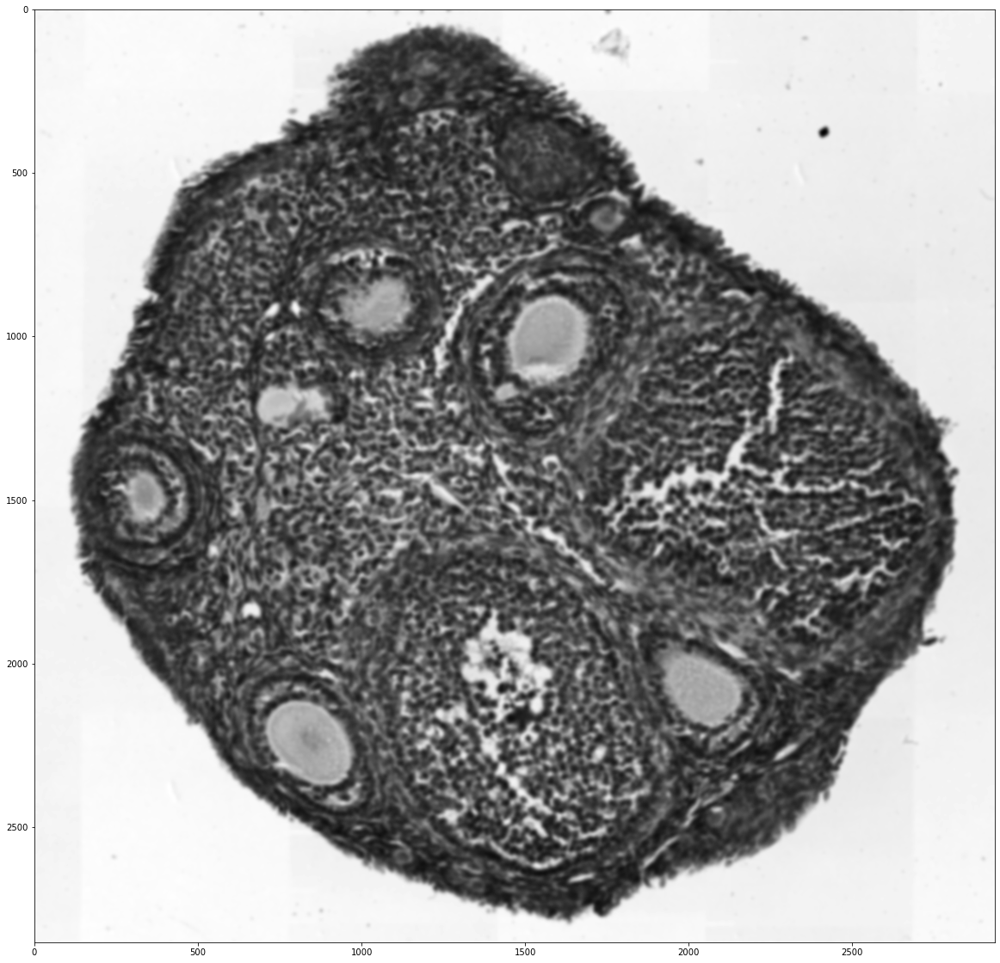

In [766]:
plt.figure(figsize=(20,50))
image_pow_bw_blurred = cv2.GaussianBlur(image_pow_bw, (31,31),0,0)
plt.imshow(
    image_pow_bw_blurred,
    cmap="gray"
)

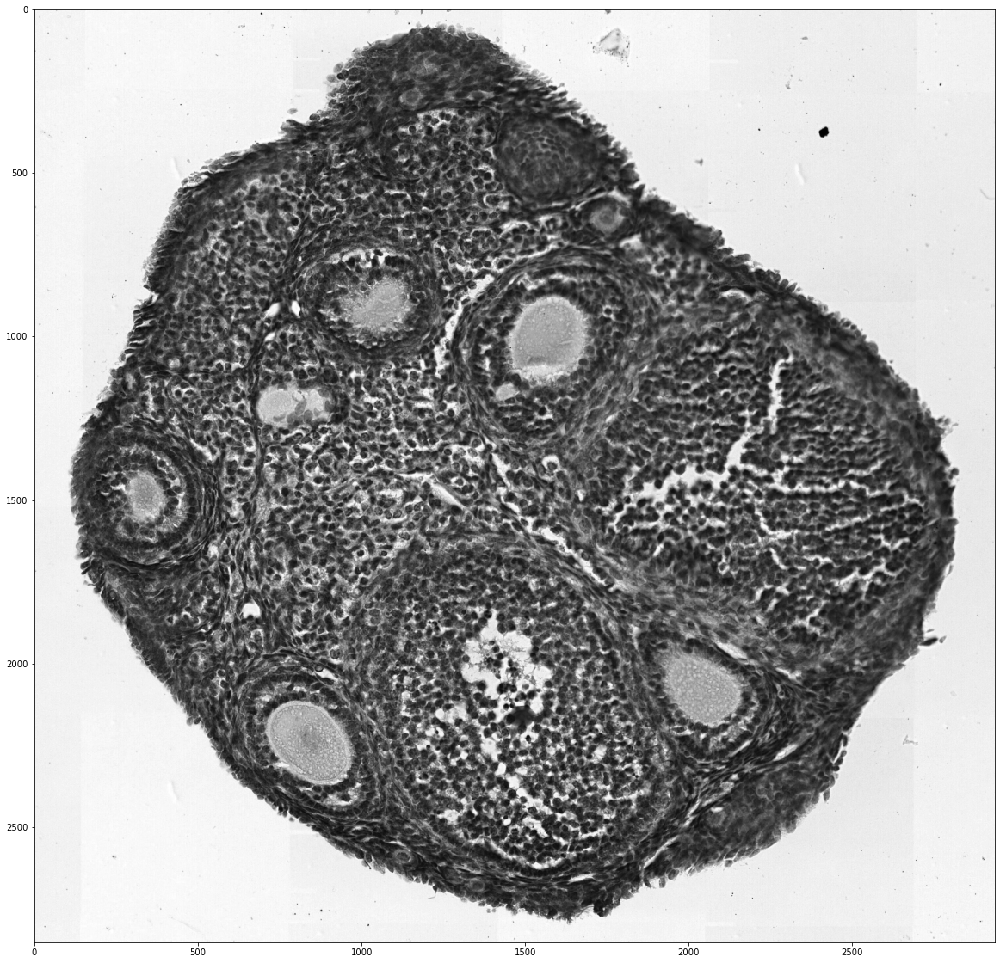

In [767]:
image_pow_bw = image_pow.mean(axis=2)

plt.figure(figsize=(20,50))

plt.imshow(image_pow_bw, cmap="gray")

In [768]:
kernel_locations = train_label[
    train_label["filename"] == filename.split("\\")[-1]
].query("label in [1,2]")[["ymin","ymax","xmin","xmax"]].values.tolist()

In [769]:
h_values = []
for x, i in zip(kernel_locations, range(len(kernel_locations))):
    val = image_pow_bw_blurred[x[0]:x[1], x[2]:x[3]].flatten().reshape(-1,1)
    val_id = np.repeat(i, len(val)).reshape(-1,1)
    h_values.append(np.concatenate([val, val_id], axis=1))

In [770]:
values = np.concatenate(h_values)

In [777]:
values_df = pd.DataFrame(values) \
    .rename(columns={0:"intensity",1:"id"})

values_df["intensity"] = pd.cut(
    values_df["intensity"],
    100
)

values_df.groupby("intensity").count() \
    .sort_values(by="id", ascending=False) \
    .head(20)

,id
intensity,
"(47.539, 49.368]",2535
"(45.71, 47.539]",2361
"(49.368, 51.197]",2291
"(43.881, 45.71]",2019
"(51.197, 53.026]",2018
"(42.052, 43.881]",1747
"(53.026, 54.855]",1724
"(69.487, 71.316]",1723
"(67.658, 69.487]",1686


In [793]:
min_range = np.array([45])
max_range = np.array([50])

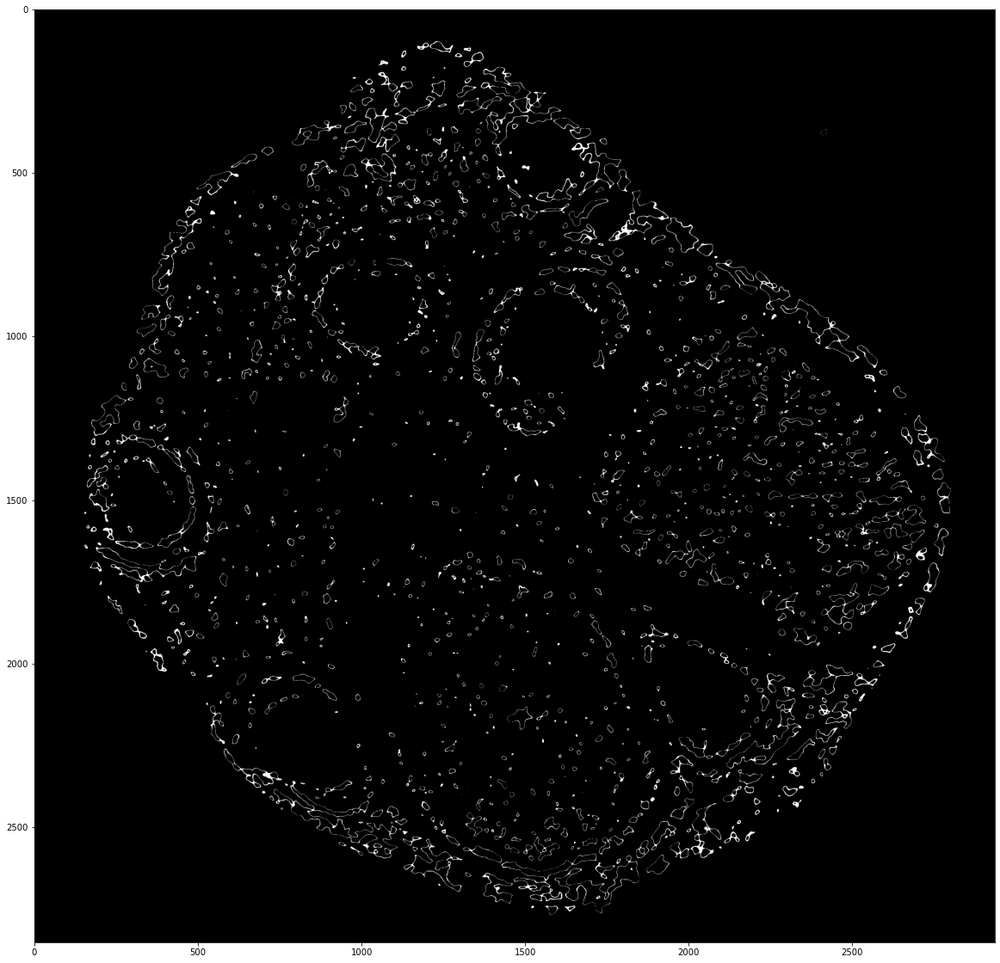

In [794]:
plt.figure(figsize=(20,50))

image_pow_bw_binary = ((image_pow_bw_blurred >= min_range[0]) & (image_pow_bw_blurred <= max_range[0])).astype(np.uint8)
plt.imshow(image_pow_bw_binary, cmap="gray")

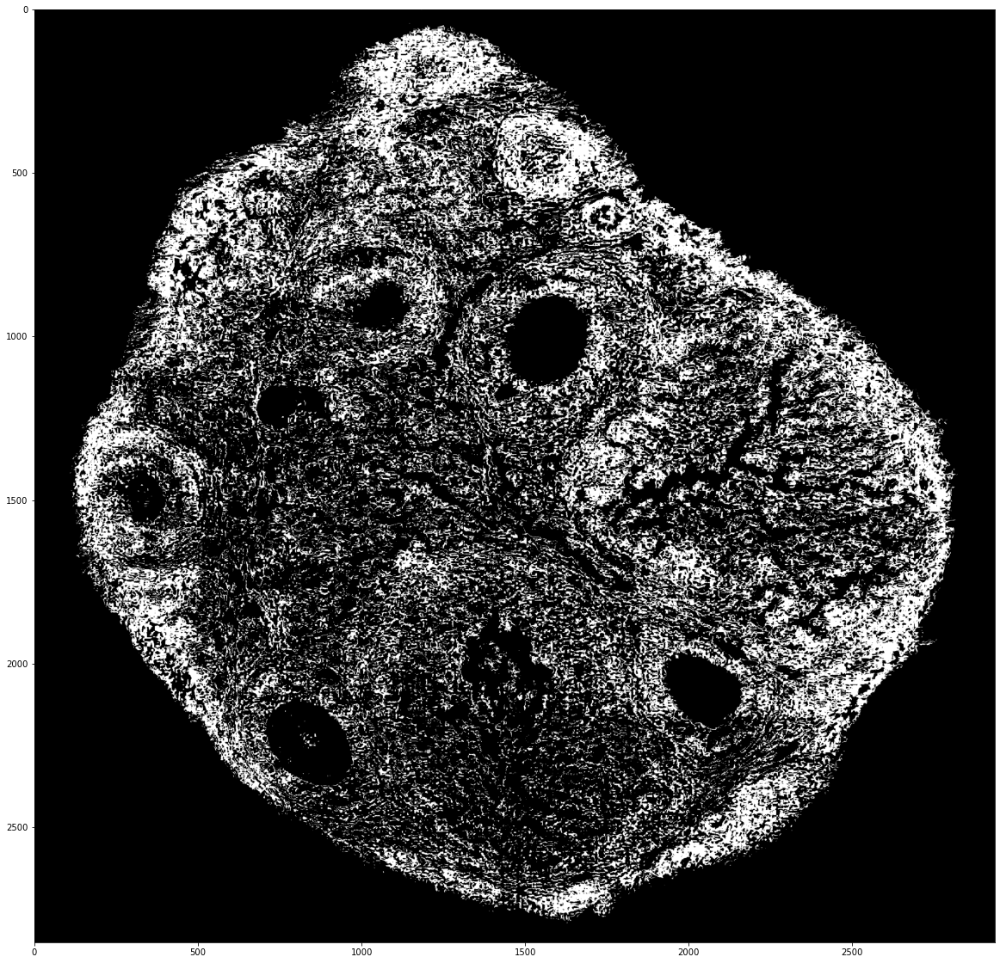

In [626]:
plt.figure(figsize=(20,50))
plt.imshow(mask**10, cmap="gray")

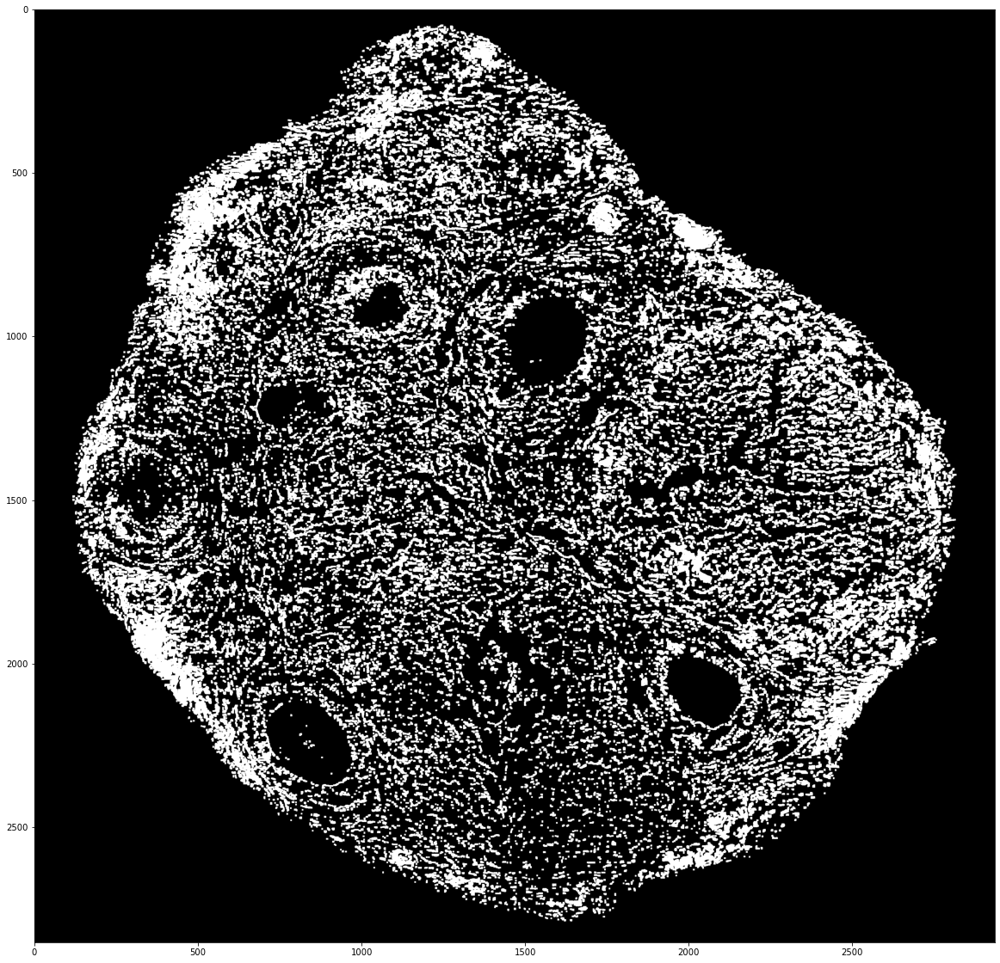

In [573]:
mask_dilate = cv2.dilate(mask, np.ones((3,3)), iterations=2)
plt.figure(figsize=(20,50))
plt.imshow(mask_dilate, cmap="gray")

In [574]:
mask_blurred = cv2.GaussianBlur(mask, (31,31), 0, 0)

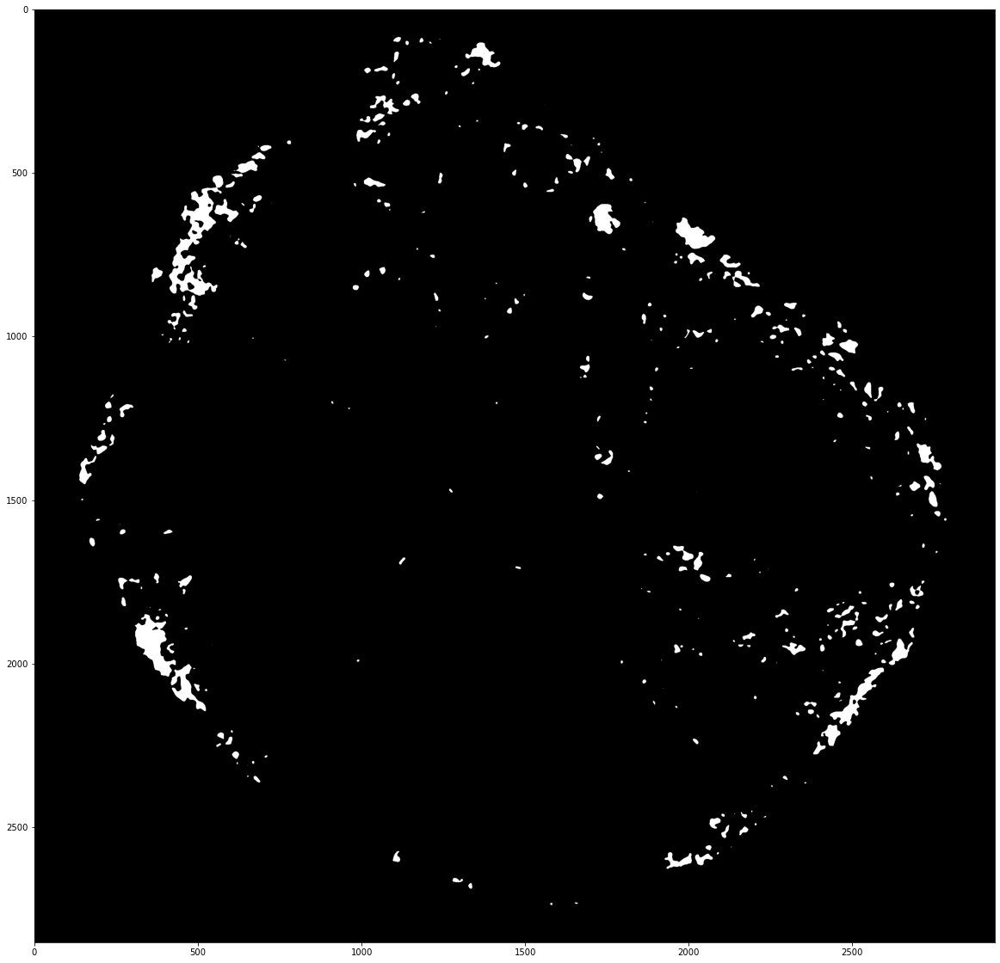

In [575]:
plt.figure(figsize=(20,50))

plt.imshow(mask_blurred, cmap="gray")

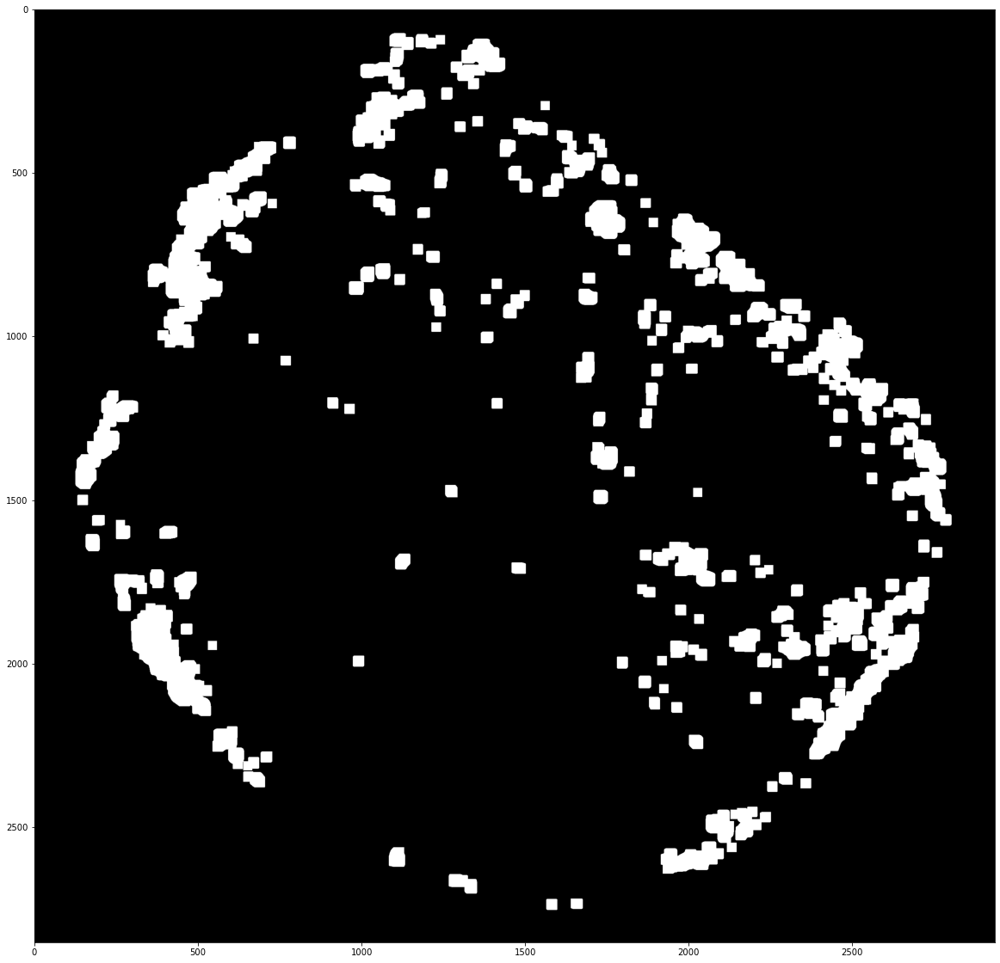

In [576]:
mask_blurred_dilate = cv2.dilate(mask_blurred, np.ones((10,10)), iterations=3)
plt.figure(figsize=(20,50))
plt.imshow(mask_blurred_dilate, cmap="gray")

In [577]:
cnt, _ = cv2.findContours(mask_blurred_dilate, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

In [578]:
box_list = []

for c in cnt:
    x, y, w, h = cv2.boundingRect(c)
    w_padding = w*0.5
    h_padding = h*0.5

    # Getting x_min, y_min, x_max, y_max
    x_min, y_min, x_max, y_max = x-w_padding, y-h_padding, x+w+w_padding, y+h+h_padding
    y_min, x_min = tuple([int(i) if i > 0 else 0 for i in [y_min, x_min]])
    y_max, x_max = tuple([int(i) if i < j else j for i,j in zip([y_max, x_max], image.shape)])

    # Finally, getting the coordonates for real image
    x_min, x_max = tuple([int(1*i) for i in [x_min, x_max]])
    y_min, y_max = tuple([int(1*i) for i in [y_min, y_max]])

    box_list.append([x_min, y_min, x_max, y_max])

In [579]:
temp_train_label = train_label.query("label in (1,2)").reset_index()

temp_train_label["box_w"] = temp_train_label["xmax"]-temp_train_label["xmin"]
temp_train_label["box_h"] = temp_train_label["ymax"]-temp_train_label["ymin"]

In [580]:
ratio_min = np.quantile((temp_train_label["box_h"]/temp_train_label["box_w"]), 0.01)
ratio_max = np.quantile((temp_train_label["box_h"]/temp_train_label["box_w"]), 0.99)

rel_size_min = np.quantile((temp_train_label["box_w"]*temp_train_label["box_h"])/(temp_train_label["height"]*temp_train_label["width"]),0.01)
rel_size_max = np.quantile((temp_train_label["box_w"]*temp_train_label["box_h"])/(temp_train_label["height"]*temp_train_label["width"]), 0.99)

In [581]:
box_list = []

for c in cnt:
    x, y, w, h = cv2.boundingRect(c)
    w_padding = w
    h_padding = h

    # Getting x_min, y_min, x_max, y_max
    x_min, y_min, x_max, y_max = x-w_padding, y-h_padding, x+w+w_padding, y+h+h_padding
    y_min, x_min = tuple([int(i) if i > 0 else 0 for i in [y_min, x_min]])
    y_max, x_max = tuple([int(i) if i < j else j for i,j in zip([y_max, x_max], image.shape)])

    # Finally, getting the coordonates for real image
    x_min, x_max = tuple([int(1*i) for i in [x_min, x_max]])
    y_min, y_max = tuple([int(1*i) for i in [y_min, y_max]])

    box_list.append([x_min, y_min, x_max, y_max])

In [582]:
area = image.shape[0]*image.shape[1]
new_box_list = []
for x in box_list:
    w = x[2]-x[0]
    h = x[3]-x[1]

    ratio = h/w
    relative_size = (w*h)/area

    if ratio_min <= ratio <= ratio_max and rel_size_min <= relative_size <= rel_size_max:
        new_box_list.append(x)

In [583]:
pred = [{"bbox":x, "class":y} for x,y in zip(new_box_list, ["box" for x in range(len(box_list))])]

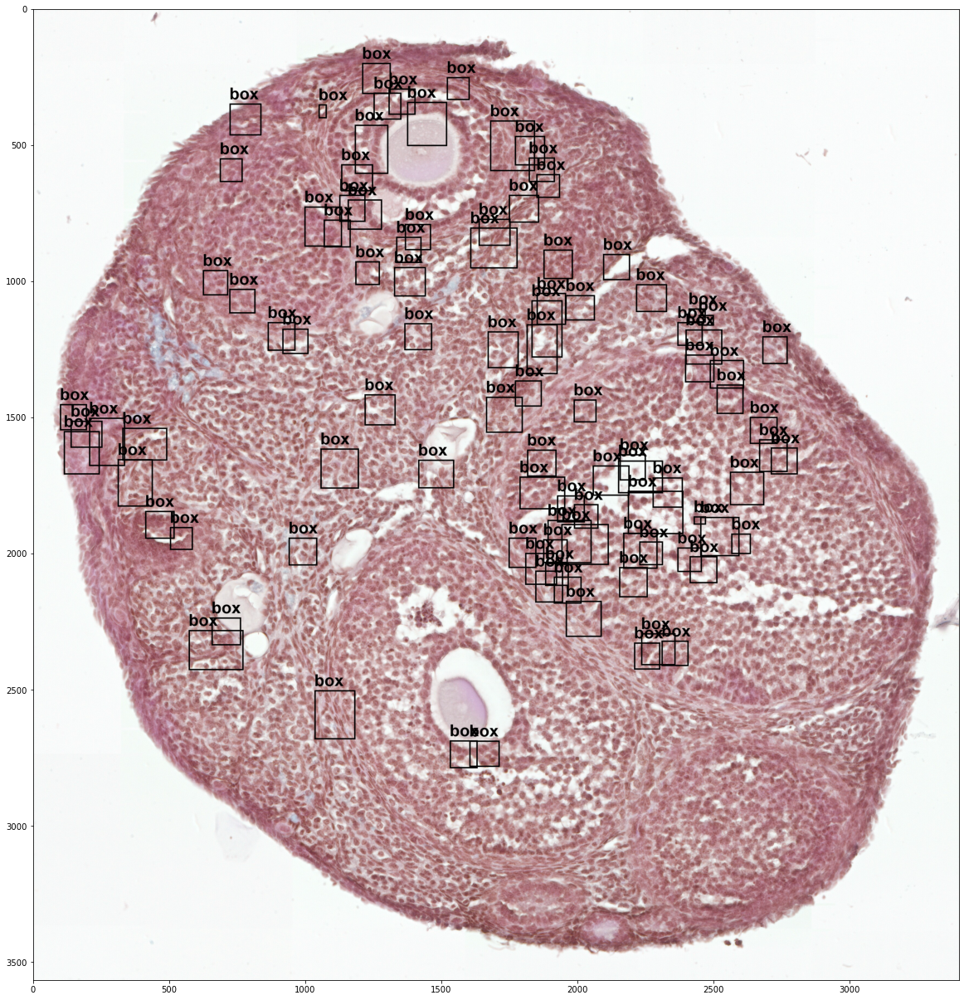

In [584]:
plt.figure(figsize=(20,50))
plt.imshow(
    toolbox.write_rectangle(image, pred),
    cmap="gray"
)